In [1]:
#!pip install cytominer-eval
import os
import pandas as pd 
import numpy as np
import matplotlib  as mpl
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

%matplotlib inline
import os, shutil, glob
from PIL import Image
from random import randint
# import re, math
import seaborn as sns; sns.set_style("white")
# from sklearn.manifold import TSNE
import datetime
import gc
from pathlib import Path
from cytominer_eval import evaluate
import scanpy as sc 
from sklearn.decomposition import PCA
import polars as pl
import matplotlib as mpl
# 300 dpi
mpl.rcParams['figure.dpi'] = 300
# settings to display more columns and rows
pd.set_option("max_colwidth", 200)
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)

In [2]:
dfU2OS = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/df_U2OS.csv'
df_U2OS = pd.read_csv(f'{dfU2OS}', sep=';')

In [3]:
# Add ReplicateGroup and Replicate columns.
df_U2OS['ReplicateGroup'] = df_U2OS['compound_id'] + '_' + df_U2OS['cmpd_conc'].astype(str) 
df_U2OS['Replicate'] = df_U2OS['ReplicateGroup'] + '_' + df_U2OS['ImageID']

In [4]:
# Select numeric columns from the DataFrame
df_numeric = df_U2OS.select_dtypes(include=np.number)
    
# Print the head of the numeric DataFrame and its columns
print("Head of numeric columns:")
print(df_numeric.head())
print("\nColumns in df_numeric:", df_numeric.columns.tolist())

numeric_columns = df_numeric.columns.values.tolist()
 
# # Remove the last 9 numeric columns
# numeric_columns = numeric_columns[:-9]

# # Filter feature columns based on specific criteria
feature_columns = [fc for fc in numeric_columns if ('Metadata' not in fc) &
                        ('Number' not in fc) & ('Outlier' not in fc) &
                        ('ImageQuality' not in fc) & ('concentration' not in fc) &
                        ('Total' not in fc) & ("cmpd_conc" not in fc) & ("ImageNumber_c" not in fc) & ("ObjectNumber_cells" not in fc)]

print(f'Excluded columns that are "Metadata", etc.: remaining {len(feature_columns)}')

 # Subset the DataFrame to keep only feature columns
X = df_U2OS.loc[:, feature_columns]

# Drop columns with missing values
X.dropna(axis=1, inplace=True)
print(f'Removed features with missing values: remaining {X.shape[1]}')

# Exclude features with low standard deviation
X = X.loc[:, (X.std() > 0.001)]
print(f'Excluded features with SD < 0.001: remaining {X.shape[1]}')

# Create a list of remaining varying features
varying_features = list(X.columns)

Head of numeric columns:
   ImageNumber_nuclei  ObjectNumber_nuclei  Metadata_AcqID  Metadata_Site  \
0                 1.0                 42.0          1362.0              1   
1                 1.0                 43.5          1362.0              2   
2                 1.0                 74.0          1362.0              3   
3                 1.0                 50.5          1362.0              4   
4                 1.0                 47.0          1362.0              5   

   AreaShape_Area_nuclei  AreaShape_BoundingBoxArea_nuclei  \
0            2131.795181                       2931.445783   
1            2142.441860                       3018.011628   
2            2278.931973                       3178.394558   
3            2338.490000                       3238.780000   
4            2268.139785                       3196.752688   

   AreaShape_BoundingBoxMaximum_X_nuclei  \
0                             960.638554   
1                            1010.279070   
2      

In [15]:
df_U2OS

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id.1,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,ReplicateGroup,Replicate
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,2131.795181,2931.445783,960.638554,1125.457831,907.457831,1072.060241,933.68945,1098.1782,1.260955,2202.638554,0.717754,50.479680,1.000000,0.731450,0.804235,63.141754,62.866806,20.120483,7.805680,7.041424,41.041996,41.450010,8.326373,176.673450,0.965030,0.655136,0.044279,0.153259,0.079043,0.018000,0.015624,0.029609,0.020195,0.023385,0.013351,0.012210,0.007129,0.010855,0.015658,0.009367,0.010020,0.007887,0.007845,...,0.211003,-0.023631,0.205681,-0.007268,-0.174204,0.152580,0.372422,-0.147382,-0.164113,0.234112,-0.307315,0.062425,-0.249644,0.057171,0.026649,-0.112131,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,PI3K,TGX-221,72,U2OS_P015230,CBK278070_1.25,CBK278070_1.25_P015230_B02_1
1,P015230_B02_2,P015230,B02,1.0,43.5,1362.0,2,2142.441860,3018.011628,1010.279070,1345.802326,957.023256,1292.209302,983.03687,1318.6816,1.281791,2213.151163,0.742753,49.862810,1.058140,0.701325,0.794023,64.016495,63.853630,

In [35]:
# Copy the sites DataFrame
df = df_U2OS.copy()


# Assuming the first 7 and the last 14 columns are metadata
metadata_columns = list(df.columns[:6]) + list(df.columns[-26:])

features_columns = varying_features
dfDMSO = df[df['compound_id'] == '[dmso]']  # Calculate median values for DMSO

# If you need to print the lists
print("Metadata columns list:", metadata_columns)
print("Features columns list:", features_columns)
print("dmso columns list:", len(features_columns))

Metadata columns list: ['ImageID', 'Metadata_Barcode', 'Metadata_Well', 'ImageNumber_nuclei', 'ObjectNumber_nuclei', 'Metadata_AcqID', 'pert_type', 'cmpd_conc', 'cell_line', 'cells_per_well', 'batch_id.1', 'compound_id', 'libid', 'libtxt', 'smiles', 'inchi', 'inkey', 'plateWell', 'barcode', 'size', 'seeded', 'plate_type', 'treatment', 'painted', 'compound_name', 'therapeutic_class_2023', 'Family', 'cmpd_name', 'Count_nuclei', 'cell_line_plate', 'ReplicateGroup', 'Replicate']
Features columns list: ['AreaShape_Area_nuclei', 'AreaShape_BoundingBoxArea_nuclei', 'AreaShape_BoundingBoxMaximum_X_nuclei', 'AreaShape_BoundingBoxMaximum_Y_nuclei', 'AreaShape_BoundingBoxMinimum_X_nuclei', 'AreaShape_BoundingBoxMinimum_Y_nuclei', 'AreaShape_Center_X_nuclei', 'AreaShape_Center_Y_nuclei', 'AreaShape_Compactness_nuclei', 'AreaShape_ConvexArea_nuclei', 'AreaShape_Eccentricity_nuclei', 'AreaShape_EquivalentDiameter_nuclei', 'AreaShape_Extent_nuclei', 'AreaShape_FormFactor_nuclei', 'AreaShape_MajorAxis

In [36]:
import pandas as pd
import numpy as np

# Function to compute MAD for a DataFrame
def compute_mad(df):
    """Compute Median Absolute Deviation for each column in a DataFrame."""
    return df.apply(lambda x: np.median(np.abs(x - np.median(x))), axis=0)

# Function to apply MAD-based standardization
def mad_transform(df, medians, mads):
    """Perform MAD scaling on the DataFrame."""
    return (df - medians) / mads

# Step 1: Filter Globally Invariant Features
# Select DMSO data for global filtering
dfDMSO = df_U2OS[df_U2OS['compound_id'] == '[dmso]']

# Calculate global MADs and medians for DMSO data
global_medians = dfDMSO[features_columns].median()
global_mads = compute_mad(dfDMSO[features_columns])

# Define a threshold for invariant features
mad_threshold = 0.001
globally_varying_features = global_mads[global_mads > mad_threshold].index

print(f"Number of globally varying features: {len(globally_varying_features)}")

# Step 2: Plate-Specific Standardization
# Initialize an empty DataFrame to store MAD-scaled features
df_features_MADscaled = pd.DataFrame()

# Iterate over each unique plate
for plate, df_plate in df_U2OS.groupby('Metadata_Barcode'):
    print(f"Processing plate: {plate}")

    # Filter the data for the globally varying features
    df_plate_filtered = df_plate[globally_varying_features]

    # Select DMSO data for the current plate
    df_dmso_plate = df_plate[df_plate['compound_id'] == '[dmso]']

    # Calculate plate-specific medians and MADs for DMSO data
    plate_medians = df_dmso_plate[globally_varying_features].median()
    plate_mads = compute_mad(df_dmso_plate[globally_varying_features])

    # Avoid division by zero in case MAD = 0
    plate_mads[plate_mads == 0] = 1e-9

    # Apply MAD transformation to the feature columns for this plate
    df_plate_scaled = df_plate.copy()  # Copy to retain metadata
    df_plate_scaled[globally_varying_features] = mad_transform(
        df_plate_filtered, plate_medians, plate_mads
    )

    # Append the transformed data to the final DataFrame
    df_features_MADscaled = pd.concat([df_features_MADscaled, df_plate_scaled])

# Reset index if needed
df_features_MADscaled.reset_index(drop=True, inplace=True)

# Step 3: Verify Standardization
# Check that medians are close to 0 for DMSO data across all plates
for barcode in df_features_MADscaled.Metadata_Barcode.unique():
    plate_df = df_features_MADscaled[df_features_MADscaled.Metadata_Barcode == barcode]
    dmso_df = plate_df[plate_df.compound_id == '[dmso]'][globally_varying_features]
    print(f"Median values for DMSO in plate {barcode} (should be close to 0):")
    print(dmso_df.median())

# Step 4: Separate Metadata and Feature Data
metadata_df = df_features_MADscaled[metadata_columns]
feature_data_df = df_features_MADscaled[globally_varying_features]

# Ensure metadata and feature data indices match
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

Number of globally varying features: 1426
Processing plate: P015230
Processing plate: P015231
Processing plate: P015236
Processing plate: P015237
Processing plate: P015244
Processing plate: P015245
Median values for DMSO in plate P015230 (should be close to 0):
AreaShape_Area_nuclei                                     -4.257011e-15
AreaShape_BoundingBoxArea_nuclei                           0.000000e+00
AreaShape_BoundingBoxMaximum_X_nuclei                      0.000000e+00
AreaShape_BoundingBoxMaximum_Y_nuclei                      0.000000e+00
AreaShape_BoundingBoxMinimum_X_nuclei                      0.000000e+00
                                                               ...     
RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm    3.469447e-18
RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm    0.000000e+00
RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm    8.673617e-18
RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm    0.000000e+00
Count_nuclei      

In [49]:
df_features_MADscaled.loc[df_features_MADscaled['compound_id'].str.lower() == '[dmso]', 'Family'] = 'dmso'
df_features_MADscaled_clean = df_features_MADscaled.dropna(subset=["Family"])
# Step 4: Separate Metadata and Feature Data
metadata_df_C = df_features_MADscaled_clean[metadata_columns]
feature_data_df_C = df_features_MADscaled_clean[globally_varying_features]

In [58]:
df_features_MADscaled_clean.Family.value_counts()

Family
dmso     1080
EGFR      990
PIKK      818
CDK       639
AUR       626
STE7      610
MAPK      532
JakA      518
VEGFR     395
RAF       394
GSK       322
Akt       321
CAMKL     287
Met       286
InsR      286
Src       251
PLK       221
BCR       216
PKC       179
PI3K      178
Syk       144
FGFR      144
PDGFR     143
PIM       143
Alk       142
Fak       140
DMPK      108
PKB       108
Tec       108
IKK       108
LRRK      108
RSK       106
ROCK       72
CAMK       72
FLT3       36
mTOR       36
SGK        35
Chk        29
Name: count, dtype: int64

In [84]:
df_features_MADscaled_clean

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id.1,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,ReplicateGroup,Replicate
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,-2.521462,-3.108191,-2.527229,0.371889,-2.482360,0.443274,-2.490751,0.405478,-1.039067,-2.576354,-1.916475,-2.948308,1.000000,3.633091,1.395141,-3.694666,-3.676140,-2.279904,-2.382881,-2.544730,-2.335617,-2.179572,2.303693,-3.393120,0.646436,1.928428,0.093430,-2.833158,-2.423882,0.018000,0.015624,0.805842,0.020195,0.023385,0.013351,0.012210,0.007129,0.010855,0.015658,0.009367,0.010020,0.007887,0.007845,...,-1.361353,-0.079639,2.297794,-0.103193,-1.868648,1.616535,3.365480,-1.461767,1.950894,2.085367,-3.411174,0.772084,-2.401275,0.563757,0.365739,-1.243154,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,PI3K,TGX-221,-2.931507,U2OS_P015230,CBK278070_1.25,CBK278070_1.25_P015230_B02_1
1,P015230_B02_2,P015230,B02,1.0,43.5,1362.0,2,-2.322124,-2.035276,-1.688707,3.779353,-1.645757,3.865882,-1.663762,3.829358,1.084054,-2.393426,1.176928,-3.739649,1.058140,-4.523193,-0.578200,-2.802510,-2.671505,-3.625819,-3.6933

In [50]:
# Create AnnData object for UMAP
adata = sc.AnnData(X=feature_data_df_C, obs=metadata_df_C)

# Perform PCA and UMAP
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X')
sc.tl.umap(adata)



/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


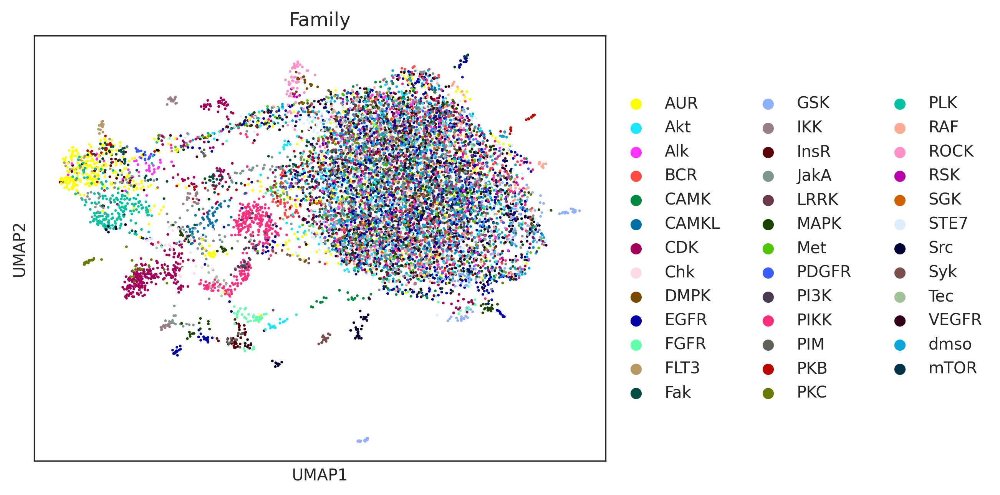

In [51]:
# Plot UMAP
sc.pl.umap(adata, color='Family')  # Adjust 'compound_id' to the metadata column of interest

In [57]:
from umap import UMAP
import plotly.express as px

df = df_features_MADscaled_clean

features = feature_data_df_C

umap_2d = UMAP(n_components=2, init='random', random_state=0)

proj_2d = umap_2d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df.Family, labels={'color': 'Family'}
)

fig_2d.show()

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



## grits

In [61]:
control_perts = df_features_MADscaled_clean.query("compound_id == '[dmso]'").Replicate.unique().tolist() # This makes a list of wells that contain DMSO
print(len(control_perts))
grit_replicate_groups = {
    "profile_col": "Replicate", 
     "replicate_group_col": "ReplicateGroup" 
}

1080


In [62]:
grit_scores = []

for one_plate in df_features_MADscaled_clean.Metadata_Barcode.unique():
    one_plate_df = df_features_MADscaled_clean.query("Metadata_Barcode == @one_plate")
    
    grit_results = evaluate(
        profiles=one_plate_df,
        features=globally_varying_features,
        meta_features=metadata_columns,
        replicate_groups=grit_replicate_groups,
        operation="grit",
        similarity_metric="pearson",
        grit_replicate_summary_method="mean", # median
        grit_control_perts=control_perts
        ).assign(one_plate=one_plate)
    grit_results = grit_results.merge(one_plate_df[['Replicate' ]], left_on = 'perturbation', right_on = 'Replicate')
    grit_scores.append(grit_results)

In [63]:
OutputDir = '/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS'
Cellline='U2OS'
grit_scores_df = pd.concat(grit_scores).reset_index(drop=True)
# #print("Before", grit_scores_df.shape)
grit_scores_df['compound'] = grit_scores_df.perturbation.str.split('_').str[0]
grit_scores_df['dose'] = grit_scores_df.perturbation.str.split('_').str[1].astype(float)
grit_scores_df.to_csv('{}/GritScores_clipped_new{}.csv'.format(OutputDir, Cellline), sep=';')
# #print("After", grit_scores_df.shape)
# #grit_scores.head()
grit_scores_df.head(9)

,perturbation,group,grit,one_plate,Replicate,compound,dose
0,CBK016914_1.25_P015230_D16_1,CBK016914_1.25,1.104907,P015230,CBK016914_1.25_P015230_D16_1,CBK016914,1.25
1,CBK016914_1.25_P015230_D16_2,CBK016914_1.25,1.221908,P015230,CBK016914_1.25_P015230_D16_2,CBK016914,1.25
2,CBK016914_1.25_P015230_D16_3,CBK016914_1.25,0.719863,P015230,CBK016914_1.25_P015230_D16_3,CBK016914,1.25
3,CBK016914_1.25_P015230_D16_4,CBK016914_1.25,1.229271,P015230,CBK016914_1.25_P015230_D16_4,CBK016914,1.25
4,CBK016914_1.25_P015230_D16_5,CBK016914_1.25,1.041974,P015230,CBK016914_1.25_P015230_D16_5,CBK016914,1.25
5,CBK016914_1.25_P015230_D16_6,CBK016914_1.25,0.600918,P015230,CBK016914_1.25_P015230_D16_6,CBK016914,1.25
6,CBK016914_1.25_P015230_D16_7,CBK016914_1.25,1.245334,P015230,CBK016914_1.25_P015230_D16_7,CBK016914,1.25
7,CBK016914_1.25_P015230_D16_8,CBK016914_1.25,0.814445,P015230,CBK016914_1.25_P015230_D16_8,CBK016914,1.25
8,CBK016914_1.25_P015230_D16_9,CBK016914_1.25,0.696283,P015230,CBK016914_1.25_P015230_D16_9,CBK016914,1.25


In [64]:
grit_scores_grouped = grit_scores_df.groupby('group').mean(numeric_only=True).reset_index()
# Split 'group' column to get 'compound' and 'dose'
grit_scores_grouped[['compound', 'dose']] = grit_scores_grouped['group'].str.split('_', expand=True)

# Convert 'dose' column to float
grit_scores_grouped['dose'] = grit_scores_grouped['dose'].astype(float)
#grit_scores_grouped['compound'] = grit_scores_grouped.index.str.split('_').str[0]
# grit_scores_grouped['doses'] = grit_scores_grouped.index.str.split('_').str[1].astype(float)

grit_scores_grouped.sort_values(by=['compound','dose'], inplace=True)
grit_scores_grouped.to_csv('{}/GritScoresGrouped_clipped_new{}.csv'.format(OutputDir, Cellline), sep=';')


In [70]:
grit_scores_grouped

,group,grit,dose,compound
0,CBK013405_1.25,8.672010e-01,1.25,CBK013405
1,CBK013405_5.0,1.450696e+00,5.00,CBK013405
2,CBK016914_1.25,9.782660e-01,1.25,CBK016914
3,CBK016914_5.0,1.415119e+00,5.00,CBK016914
4,CBK040892_1.25,2.097868e+00,1.25,CBK040892
...,...,...,...,...
551,CBK293911_1.25,1.006096e+00,1.25,CBK293911
552,CBK293911_5.0,4.929807e+00,5.00,CBK293911
553,CBK293912G_1.25,1.066704e+00,1.25,CBK293912G
554,CBK293912G_5.0,1.191914e+00,5.00,CBK293912G


In [65]:
df_grits_clean = grit_scores_grouped.drop(['dose', 'compound'], axis=1, errors='ignore')


In [71]:
# Ensure the grits column contains only numeric values
grits = df_grits_clean['grit'].apply(pd.to_numeric, errors='coerce')  # Replace 'grit' with your column name if different

# Drop NaN values that may have been introduced during conversion
grits = grits.dropna()

# Convert to a NumPy array and sort
grits = np.sort(grits)

print("Number of unique grit scores:", len(grits))
grit_below_1 = (grits < 0.99).sum()
print("Number of grits scores below 0.99:", grit_below_1)

# Filter DataFrames based on grit scores
df_grit_1 = grit_scores_grouped[grit_scores_grouped['grit'] >= 0.99].sort_values(by=['grit'])
print("Number of grit scores higher than 0.99:", len(df_grit_1))

df_grit_1_5 = grit_scores_grouped[grit_scores_grouped['grit'] >= 1.5].sort_values(by=['grit'])
print("Number of grit scores higher than 1.5:", len(df_grit_1_5))

df_grit_4 = grit_scores_grouped[grit_scores_grouped['grit'] >= 4].sort_values(by=['grit'])
print("Number of grit scores higher than 4:", len(df_grit_4))

Number of unique grit scores: 556
Number of grits scores below 0.99: 101
Number of grit scores higher than 0.99: 455
Number of grit scores higher than 1.5: 307
Number of grit scores higher than 4: 72


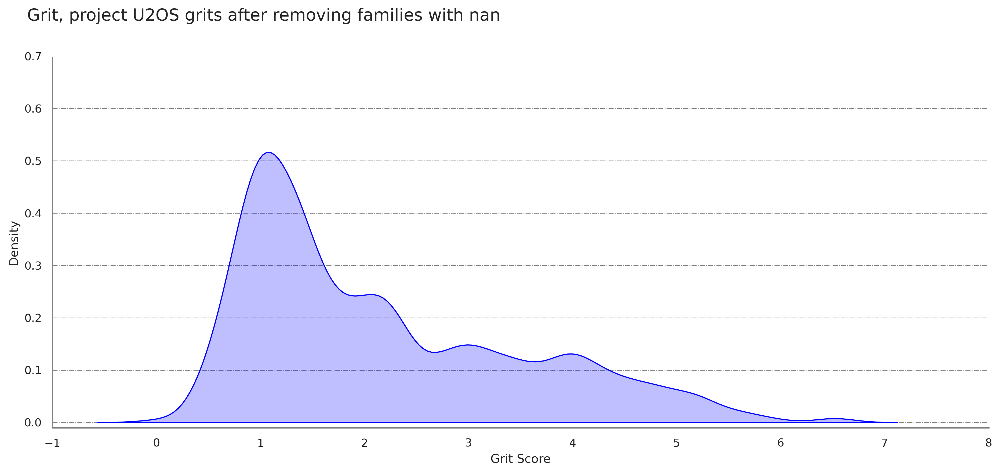

In [74]:
# visualize the grit scores with KDE plot

# Define your project name
project = 'U2OS grits after removing families with nan'

# Initialize the figure and set its size
fig = plt.figure(figsize=(15, 6))

# Set Seaborn style and font size
sns.set(font_scale=0.9)

# Add a super title for the figure
fig.suptitle(
    f'Grit, project {project}',
    fontsize=15,
    x=0.3
)

# Define subplot layout (1 row, 1 column)
ax = fig.add_subplot(1, 1, 1)

# Create a KDE plot for Grit scores
sns.kdeplot(
    data=grit_scores_grouped['grit'],  # Assuming 'grit' is the column with Grit scores
    fill=True,
    color="blue",
    bw_adjust=0.5,
    ax=ax
)

# Customize plot appearance
ax.set_facecolor('w')
ax.spines['bottom'].set_color('grey')
ax.spines['left'].set_color('grey')
ax.set_ylim([-0.01, 0.7])  # Set y-axis limits as per your data distribution
ax.set_xlim([-1, 8])  # Match the x-axis to expected range of grit scores
ax.yaxis.grid(which="major", color='grey', linestyle='-.', linewidth=0.7)
plt.axhline(y=1, color='r', linestyle='-.')  # Optional: if you want a reference line at y=1
ax.set_xlabel('Grit Score')
ax.set_ylabel('Density')

# Display the plot
plt.show()

In [75]:
df_grit_1

,group,grit,dose,compound
92,CBK277980_1.25,0.994733,1.25,CBK277980
166,CBK278129_1.25,0.995097,1.25,CBK278129
545,CBK293908_1.25,1.002507,1.25,CBK293908
338,CBK290457C_1.25,1.002990,1.25,CBK290457C
231,CBK288293_5.0,1.004189,5.00,CBK288293
...,...,...,...,...
277,CBK288335_5.0,5.646538,5.00,CBK288335
281,CBK288341_5.0,5.760054,5.00,CBK288341
317,CBK290215_5.0,5.927239,5.00,CBK290215
514,CBK293887_5.0,6.486628,5.00,CBK293887


In [76]:
df_grit_1 = df_grit_1.reset_index(drop=True)
df_grit_1['ReplicateGroup'] = df_grit_1['compound'] + '_' + df_grit_1['dose'].astype(str) 
display(df_grit_1)


,group,grit,dose,compound,ReplicateGroup
0,CBK277980_1.25,0.994733,1.25,CBK277980,CBK277980_1.25
1,CBK278129_1.25,0.995097,1.25,CBK278129,CBK278129_1.25
2,CBK293908_1.25,1.002507,1.25,CBK293908,CBK293908_1.25
3,CBK290457C_1.25,1.002990,1.25,CBK290457C,CBK290457C_1.25
4,CBK288293_5.0,1.004189,5.00,CBK288293,CBK288293_5.0
...,...,...,...,...,...
450,CBK288335_5.0,5.646538,5.00,CBK288335,CBK288335_5.0
451,CBK288341_5.0,5.760054,5.00,CBK288341,CBK288341_5.0
452,CBK290215_5.0,5.927239,5.00,CBK290215,CBK290215_5.0
453,CBK293887_5.0,6.486628,5.00,CBK293887,CBK293887_5.0


In [77]:
df_1grit = df_features_MADscaled_clean.copy()
# Add a new column to df_U2OS, initialized to 0
df_1grit['higher_than_one_grit'] = 0

# Count occurrences of each compound in df_Low_grit_1
df_1grit['higher_than_one_grit'] = df_1grit['ReplicateGroup'].apply(
    lambda x: (df_grit_1['ReplicateGroup'] == x).sum()
)

# Display the updated DataFrame
display(df_1grit.head(2))

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id.1,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,ReplicateGroup,Replicate,higher_than_one_grit
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,-2.521462,-3.108191,-2.527229,0.371889,-2.482360,0.443274,-2.490751,0.405478,-1.039067,-2.576354,-1.916475,-2.948308,1.00000,3.633091,1.395141,-3.694666,-3.676140,-2.279904,-2.382881,-2.544730,-2.335617,-2.179572,2.303693,-3.393120,0.646436,1.928428,0.093430,-2.833158,-2.423882,0.018000,0.015624,0.805842,0.020195,0.023385,0.013351,0.012210,0.007129,0.010855,0.015658,0.009367,0.010020,0.007887,0.007845,...,-0.079639,2.297794,-0.103193,-1.868648,1.616535,3.365480,-1.461767,1.950894,2.085367,-3.411174,0.772084,-2.401275,0.563757,0.365739,-1.243154,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,PI3K,TGX-221,-2.931507,U2OS_P015230,CBK278070_1.25,CBK278070_1.25_P015230_B02_1,1
1,P015230_B02_2,P015230,B02,1.0,43.5,1362.0,2,-2.322124,-2.035276,-1.688707,3.779353,-1.645757,3.865882,-1.663762,3.829358,1.084054,-2.393426,1.176928,-3.739649,1.05814,-4.523193,-0.578200,-2.802510,-2.671505,-3.625819,-3.693397,-3.642372,-4.320237,-4.382221,0.612836,-3.

In [78]:
df_1grit.higher_than_one_grit.unique()
# Count the number of rows where 'higher_than_one_grit' is 0
num_rows_with_zero = (df_1grit['higher_than_one_grit'] == 0).sum()
print(f"Number of rows with 0 in 'higher_than_one_grit': {num_rows_with_zero}")

Number of rows with 0 in 'higher_than_one_grit': 2867


In [80]:
df_1grit = df_1grit.merge(df_grit_1[['ReplicateGroup', 'grit']], on='ReplicateGroup', how='left')
# Display the result
print(df_1grit.Family.value_counts())


Family
dmso     1080
EGFR      990
PIKK      818
CDK       639
AUR       626
STE7      610
MAPK      532
JakA      518
VEGFR     395
RAF       394
GSK       322
Akt       321
CAMKL     287
Met       286
InsR      286
Src       251
PLK       221
BCR       216
PKC       179
PI3K      178
Syk       144
FGFR      144
PDGFR     143
PIM       143
Alk       142
Fak       140
DMPK      108
PKB       108
Tec       108
IKK       108
LRRK      108
RSK       106
ROCK       72
CAMK       72
FLT3       36
mTOR       36
SGK        35
Chk        29
Name: count, dtype: int64


In [83]:
df_1grit

,ImageID,Metadata_Barcode,Metadata_Well,ImageNumber_nuclei,ObjectNumber_nuclei,Metadata_AcqID,Metadata_Site,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_EulerNumber_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_3_1_nuclei,AreaShape_Zernike_3_3_nuclei,AreaShape_Zernike_4_0_nuclei,AreaShape_Zernike_4_2_nuclei,AreaShape_Zernike_4_4_nuclei,AreaShape_Zernike_5_1_nuclei,AreaShape_Zernike_5_3_nuclei,AreaShape_Zernike_5_5_nuclei,AreaShape_Zernike_6_0_nuclei,AreaShape_Zernike_6_2_nuclei,AreaShape_Zernike_6_4_nuclei,AreaShape_Zernike_6_6_nuclei,AreaShape_Zernike_7_1_nuclei,AreaShape_Zernike_7_3_nuclei,...,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_8_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_9_5_cytoplasm,plateWell_x,layout_id,well,batch_id,solvent,stock_conc,cmpd_vol,well_vol,pert_type,cmpd_conc,cell_line,cells_per_well,batch_id.1,compound_id,libid,libtxt,smiles,inchi,inkey,plateWell,barcode,size,seeded,plate_type,treatment,painted,compound_name,therapeutic_class_2023,Family,cmpd_name,Count_nuclei,cell_line_plate,ReplicateGroup,Replicate,higher_than_one_grit,grit_x,grit_y
0,P015230_B02_1,P015230,B02,1.0,42.0,1362.0,1,-2.521462,-3.108191,-2.527229,0.371889,-2.482360,0.443274,-2.490751,0.405478,-1.039067,-2.576354,-1.916475,-2.948308,1.000000,3.633091,1.395141,-3.694666,-3.676140,-2.279904,-2.382881,-2.544730,-2.335617,-2.179572,2.303693,-3.393120,0.646436,1.928428,0.093430,-2.833158,-2.423882,0.018000,0.015624,0.805842,0.020195,0.023385,0.013351,0.012210,0.007129,0.010855,0.015658,0.009367,0.010020,0.007887,0.007845,...,-0.103193,-1.868648,1.616535,3.365480,-1.461767,1.950894,2.085367,-3.411174,0.772084,-2.401275,0.563757,0.365739,-1.243154,P015230_B02,kinase378-v1-plate1-L1,B02,BJ1856070,DMSO,10.0,5.0,40.0,trt,1.25,U2OS,1200.0,BJ1856070,CBK278070,Lib-2049,Selleck_known_kinase_inhibitors,CC(Nc1ccccc1)c1cc(C)cn2c1nc(cc2=O)N1CCOCC1,"InChI=1S/C21H24N4O2/c1-15-12-18(16(2)22-17-6-4-3-5-7-17)21-23-19(13-20(26)25(21)14-15)24-8-10-27-11-9-24/h3-7,12-14,16,22H,8-11H2,1-2H3",CPRAGQJXBLMUEL-UHFFFAOYSA-N,P015230_B02,P015230,384.0,2022-01-17 14:04:51,BD Falcon 353962,48.0,2022-01-19,NaN,PI3K,PI3K,TGX-221,-2.931507,U2OS_P015230,CBK278070_1.25,CBK278070_1.25_P015230_B02_1,1,1.370819,1.370819
1,P015230_B02_2,P015230,B02,1.0,43.5,1362.0,2,-2.322124,-2.035276,-1.688707,3.779353,-1.645757,3.865882,-1.663762,3.829358,1.084054,-2.393426,1.176928,-3.739649,1.058140,-4.523193,-0.578200,-2.802510,-2.671505,-3.625819,-3.693397,-3.642372,-4.320237,-4.382221,0.612836,-3.647818,-6.645231,-4.248687,-4.346758,-0.170808,-2.485136,0.014176,0.013097,0.129416,0.023773,0.02

In [81]:
df_1grit.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_df_g1_test.csv', sep=';', index=False)

## THINGS I TRIED

In [52]:
# import scanpy as sc

# # Unique plates
# plates = df_features_MADscaled["Metadata_Barcode"].unique()

# # Dictionary to store individual AnnData objects for each plate
# plate_adata_objects = {}

# # Loop through each plate
# for plate in plates:
#     print(f"Processing Plate: {plate}")
    
#     # Filter DataFrame for the current plate
#     plate_df = df_features_MADscaled[df_features_MADscaled["Metadata_Barcode"] == plate]
    
#     # Separate feature data and metadata for the current plate
#     plate_feature_data = plate_df[features_columns]  # Replace `features_columns` with your actual feature column list
#     plate_metadata = plate_df[metadata_columns]      # Replace `metadata_columns` with your actual metadata column list
    
#     # Ensure metadata has the same row indices as feature data
#     if not plate_feature_data.index.equals(plate_metadata.index):
#         raise ValueError(f"The indices of feature data and metadata do not match for plate {plate}.")
    
#     # Create AnnData object with feature data and metadata for the current plate
#     adata_newstd = sc.AnnData(X=plate_feature_data.values, obs=plate_metadata)
    
#     # Store the AnnData object for later use if needed
#     plate_adata_objects[plate] = adata_newstd
    
#     # Compute UMAP
#     sc.pp.neighbors(adata_newstd)  # This computes the neighborhood graph
#     sc.tl.umap(adata_newstd)       # This computes the UMAP coordinates
    
#     # Plot UMAP
#     sc.pl.umap(
#         adata_newstd,
#         color='Family',                  # Replace with actual metadata column name
#         title=f'CP standardized data - {plate} - old_family_label',  # Plot title
#         size=20,                                   # Size of points
#     )

# print("All plates processed successfully!")

In [53]:
# import scanpy as sc

# # Unique plates
# plates = df_features_MADscaled["Metadata_Barcode"].unique()

# # Dictionary to store individual AnnData objects for each plate
# plate_adata_objects = {}

# # Loop through each plate
# for plate in plates:
#     print(f"Processing Plate: {plate}")
    
#     # Filter DataFrame for the current plate
#     plate_df = df_features_MADscaled[df_features_MADscaled["Metadata_Barcode"] == plate]
    
#     # Separate feature data and metadata for the current plate
#     plate_feature_data = plate_df[features_columns]  # Replace `features_columns` with your actual feature column list
#     plate_metadata = plate_df[metadata_columns]      # Replace `metadata_columns` with your actual metadata column list
    
#     # Ensure metadata has the same row indices as feature data
#     if not plate_feature_data.index.equals(plate_metadata.index):
#         raise ValueError(f"The indices of feature data and metadata do not match for plate {plate}.")
    
#     # Create AnnData object with feature data and metadata for the current plate
#     adata_newstd = sc.AnnData(X=plate_feature_data.values, obs=plate_metadata)
    
#     # Store the AnnData object for later use if needed
#     plate_adata_objects[plate] = adata_newstd
    
#     # Compute UMAP
#     sc.pp.neighbors(adata_newstd)  # This computes the neighborhood graph
#     sc.tl.umap(adata_newstd)       # This computes the UMAP coordinates
    
#     # Plot UMAP
#     sc.pl.umap(
#         adata_newstd,
#         color='pert_type',                  # Replace with actual metadata column name
#         title=f'CP standardized data - {plate} - type',  # Plot title
#         size=20,                                   # Size of points
#     )

# print("All plates processed successfully!")

In [55]:
# from umap import UMAP
# import plotly.express as px

# df = df_features_MADscaled
# df['Family'] = df['Family'].fillna('Unknown')

# features = feature_data_df_C

# umap_2d = UMAP(n_components=2, init='random', random_state=0)

# proj_2d = umap_2d.fit_transform(features)
# # Convert NaN values to 'Unknown' in 'Family' column
# fig_2d = px.scatter(
#     proj_2d, x=0, y=1,
#     color=df.Family, labels={'color': 'Family'}
# )

# fig_2d.show()

## CONTINUE

In [88]:
new_dfa = "/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/U2OS_g1_metasof_test.csv"
new_df = pd.read_csv(f'{new_dfa}', sep=';')

/tmp/ipykernel_484840/4230865678.py:2: DtypeWarning:

Columns (1440) have mixed types. Specify dtype option on import or set low_memory=False.



In [89]:
new_df.head(2)

,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_4_0_nuclei,Children_cytoplasm_Count_nuclei,Correlation_Correlation_illumCONC_illumHOECHST_nuclei,Correlation_Correlation_illumCONC_illumMITO_nuclei,Correlation_Correlation_illumCONC_illumPHAandWGA_nuclei,Correlation_Correlation_illumCONC_illumSYTO_nuclei,Correlation_Correlation_illumHOECHST_illumMITO_nuclei,Correlation_Correlation_illumHOECHST_illumPHAandWGA_nuclei,Correlation_Correlation_illumHOECHST_illumSYTO_nuclei,Correlation_Correlation_illumMITO_illumPHAandWGA_nuclei,Correlation_Correlation_illumMITO_illumSYTO_nuclei,Correlation_Correlation_illumPHAandWGA_illumSYTO_nuclei,Correlation_K_illumCONC_illumHOECHST_nuclei,Correlation_K_illumCONC_illumMITO_nuclei,Correlation_K_illumCONC_illumPHAandWGA_nuclei,Correlation_K_illumCONC_illumSYTO_nuclei,Correlation_K_illumHOECHST_illumCONC_nuclei,Correlation_K_illumHOECHST_illumMITO_nuclei,Correlation_K_illumHOECHST_illumPHAandWGA_nuclei,Correlation_K_illumHOECHST_illumSYTO_nuclei,Correlation_K_illumMITO_illumCONC_nuclei,Correlation_K_illumMITO_illumHOECHST_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit,grit,cbkid,compound_name,protein_kinase_inhibitor,receptor_family,target,inhibitory_effect,seconday_target,tertiary_target,all_targets,induces_effect,pathway,selectivity_against_others,kinase_assay,notes
0,-3.188556,-3.521105,1.632595,-4.977559,1.706048,-4.908704,1.669987,-4.938007,-2.547724,-3.244291,-2.286628,-3.277960,2.960553,2.559388,-3.754266,-3.828512,-1.867068,-2.086328,-2.086453,-2.113602,-1.937876,0.387027,-3.697332,1.078788,2.517203,-1.163799,-1.153256,-0.762283,2.058268,-0.482118,-0.410890,-0.196068,0.823225,2.009722,0.584725,-1.267680,-0.765674,2.909544,2.290897,-2.523055,-0.226017,0.230282,0.900038,0.842512,0.237867,0.268671,0.656151,0.440150,-0.266624,-0.60655

In [ ]:
new_df

In [90]:

# Load the features data
features_df = new_df

# Separate feature data and metadata
num_metadata_cols = 28
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

import scanpy as sc

# Create AnnData object with feature data
adata_filtered = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_filtered)


AnnData object with n_obs × n_vars = 8150 × 1419
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit', 'grit', 'cbkid', 'compound_name', 'protein_kinase_inhibitor', 'receptor_family', 'target', 'inhibitory_effect ', 'seconday_target', 'tertiary_target', 'all_targets', 'induces_effect', 'pathway', 'selectivity_against_others', 'kinase_assay', 'notes'


/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



In [91]:
# Perform PCA and UMAP
sc.tl.pca(adata_filtered, svd_solver='arpack')
sc.pp.neighbors(adata_filtered, n_neighbors=10, use_rep='X')
sc.tl.umap(adata_filtered)

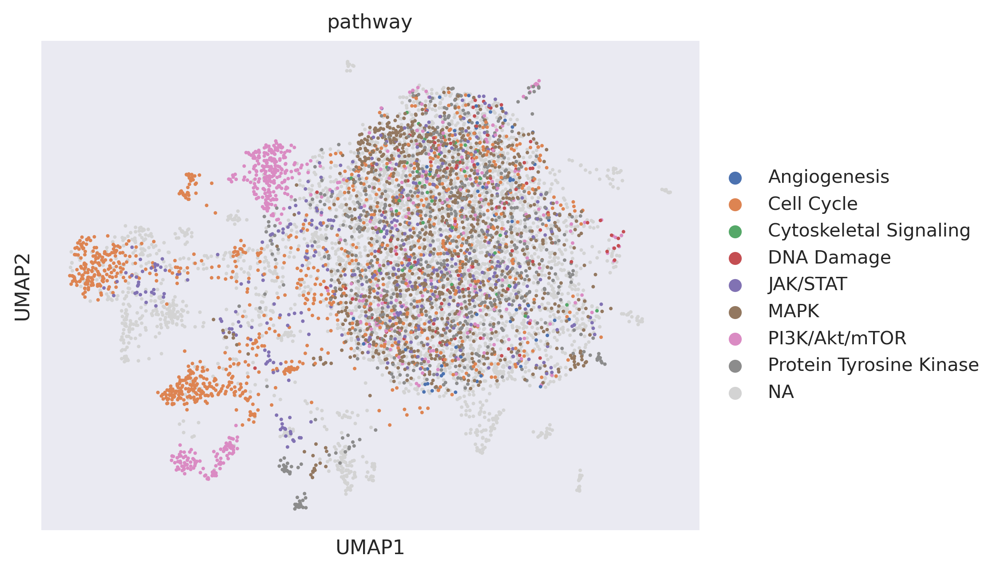

In [107]:
sc.pl.umap(adata_filtered, color='pathway')  # Adjust 'compound_id' to the metadata column of interest

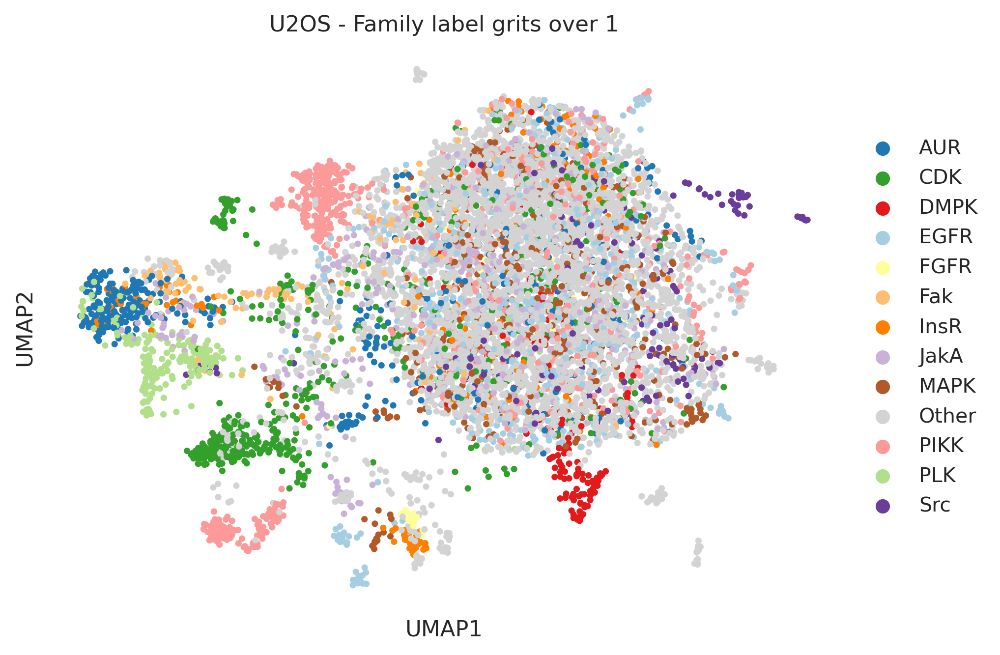

In [116]:
import seaborn as sns

# Define highlighted families and colors
highlighted_families = ['EGFR', 'AUR', 'PLK', 'CDK', 'PIKK', 'DMPK', 'Fak', 'InsR', 'JakA', 'Src', 'FGFR', 'MAPK']

# Create a new column for coloring
adata_filtered.obs['Family_highlighted'] = adata_filtered.obs['Family'].apply(
    lambda x: x if x in highlighted_families else 'Other'
)

# Define a color palette, with 'Other' as gray
palette = sns.color_palette("Paired", len(highlighted_families))
color_dict = {family: color for family, color in zip(highlighted_families, palette)}
color_dict['Other'] = 'lightgray'
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

# Plot UMAP with the new column and specified colors
sc.pl.umap(adata_filtered, color='Family_highlighted', palette=color_dict, size=40,ax=ax,title='U2OS - Family label grits over 1')

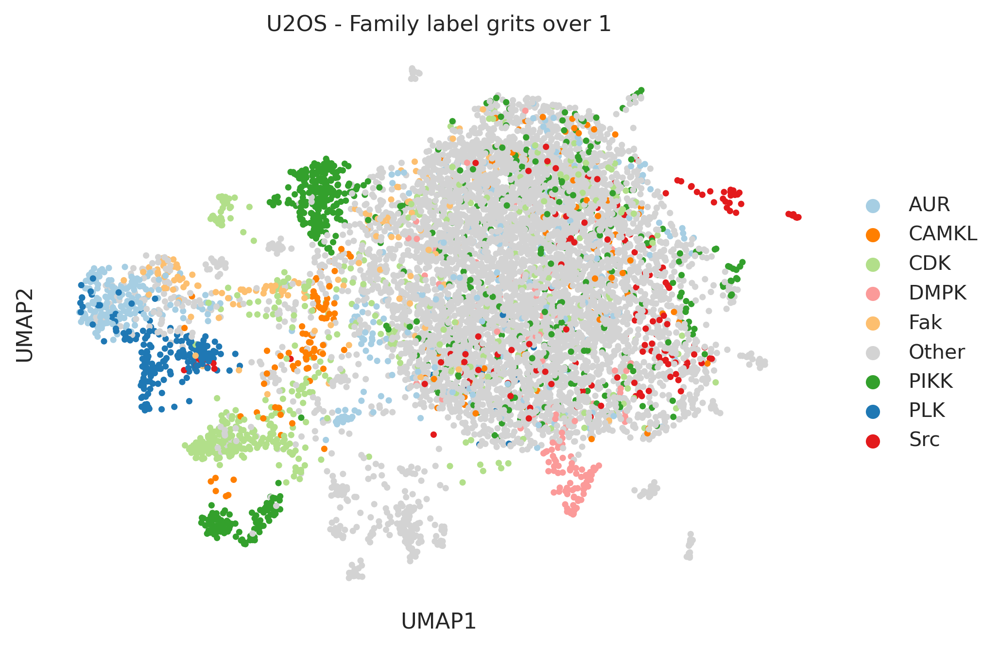

In [122]:
import seaborn as sns

# Define highlighted families and colors
highlighted_families = ['AUR', 'PLK', 'CDK', 'PIKK', 'DMPK', 'Src','Fak','CAMKL']

# Create a new column for coloring
adata_filtered.obs['Family_highlighted'] = adata_filtered.obs['Family'].apply(
    lambda x: x if x in highlighted_families else 'Other'
)

# Define a color palette, with 'Other' as gray
palette = sns.color_palette("Paired", len(highlighted_families))
color_dict = {family: color for family, color in zip(highlighted_families, palette)}
color_dict['Other'] = 'lightgray'
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_facecolor('white')  # Set background color to light gray (or any color you prefer)

# Plot UMAP with the new column and specified colors
sc.pl.umap(adata_filtered, color='Family_highlighted', palette=color_dict, size=40,ax=ax,title='U2OS - Family label grits over 1')

In [120]:
sc.tl.embedding_density(adata_filtered,basis="umap",groupby='Family')
sc.pl.embedding_density(adata_filtered,basis="umap",groupby='Family')

In [127]:
# Define the list of families to keep
families_to_keep = ['AUR', 'PLK', 'CDK', 'PIKK', 'DMPK', 'Src', 'Fak', 'CAMKL']

# Filter the DataFrame
filtered_df = new_df[new_df['Family'].isin(families_to_keep)]

# Display the resulting DataFrame
filtered_df


,AreaShape_Area_nuclei,AreaShape_BoundingBoxArea_nuclei,AreaShape_BoundingBoxMaximum_X_nuclei,AreaShape_BoundingBoxMaximum_Y_nuclei,AreaShape_BoundingBoxMinimum_X_nuclei,AreaShape_BoundingBoxMinimum_Y_nuclei,AreaShape_Center_X_nuclei,AreaShape_Center_Y_nuclei,AreaShape_Compactness_nuclei,AreaShape_ConvexArea_nuclei,AreaShape_Eccentricity_nuclei,AreaShape_EquivalentDiameter_nuclei,AreaShape_Extent_nuclei,AreaShape_FormFactor_nuclei,AreaShape_MajorAxisLength_nuclei,AreaShape_MaxFeretDiameter_nuclei,AreaShape_MaximumRadius_nuclei,AreaShape_MeanRadius_nuclei,AreaShape_MedianRadius_nuclei,AreaShape_MinFeretDiameter_nuclei,AreaShape_MinorAxisLength_nuclei,AreaShape_Orientation_nuclei,AreaShape_Perimeter_nuclei,AreaShape_Solidity_nuclei,AreaShape_Zernike_0_0_nuclei,AreaShape_Zernike_1_1_nuclei,AreaShape_Zernike_2_0_nuclei,AreaShape_Zernike_2_2_nuclei,AreaShape_Zernike_4_0_nuclei,Children_cytoplasm_Count_nuclei,Correlation_Correlation_illumCONC_illumHOECHST_nuclei,Correlation_Correlation_illumCONC_illumMITO_nuclei,Correlation_Correlation_illumCONC_illumPHAandWGA_nuclei,Correlation_Correlation_illumCONC_illumSYTO_nuclei,Correlation_Correlation_illumHOECHST_illumMITO_nuclei,Correlation_Correlation_illumHOECHST_illumPHAandWGA_nuclei,Correlation_Correlation_illumHOECHST_illumSYTO_nuclei,Correlation_Correlation_illumMITO_illumPHAandWGA_nuclei,Correlation_Correlation_illumMITO_illumSYTO_nuclei,Correlation_Correlation_illumPHAandWGA_illumSYTO_nuclei,Correlation_K_illumCONC_illumHOECHST_nuclei,Correlation_K_illumCONC_illumMITO_nuclei,Correlation_K_illumCONC_illumPHAandWGA_nuclei,Correlation_K_illumCONC_illumSYTO_nuclei,Correlation_K_illumHOECHST_illumCONC_nuclei,Correlation_K_illumHOECHST_illumMITO_nuclei,Correlation_K_illumHOECHST_illumPHAandWGA_nuclei,Correlation_K_illumHOECHST_illumSYTO_nuclei,Correlation_K_illumMITO_illumCONC_nuclei,Correlation_K_illumMITO_illumHOECHST_nuclei,...,RadialDistribution_ZernikePhase_illumPHAandWGA_9_7_cytoplasm,RadialDistribution_ZernikePhase_illumPHAandWGA_9_9_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_1_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_2_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_3_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_4_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_5_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_2_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_4_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_6_6_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_1_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_3_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_5_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_7_7_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_0_cytoplasm,RadialDistribution_ZernikePhase_illumSYTO_8_2_cytoplasm,Metadata_Barcode,Metadata_Well,Metadata_Site,Count_nuclei,compound_id,cmpd_conc,cmpd_name,Family,therapeutic_class_2023,ImageID,ReplicateGroup,Replicate,higher_than_one_grit,grit,cbkid,compound_name,protein_kinase_inhibitor,receptor_family,target,inhibitory_effect,seconday_target,tertiary_target,all_targets,induces_effect,pathway,selectivity_against_others,kinase_assay,notes
18,-2.387693,-3.163362,1.646694,-0.329097,1.680658,-0.227255,1.666785,-0.278014,-2.996112,-2.502567,-5.602493,-2.699048,4.300221,3.366809,-4.689410,-4.639899,0.183057,-0.626536,-1.076003,-0.088936,0.185247,0.693300,-3.537965,1.474128,4.939376,-0.322307,-3.116766,-4.220951,7.283333,-3.717586,1.720820,2.555016,0.506167,2.070357,1.957861,2.230232,1.260773,2.098796,3.549615,2.868006,1.139542,0.397138,-1.230998,0.433247,-1.009092,-0.381105,-1.879905,-0.816302,-0.463199,0.095310,.

In [128]:
filtered_df.Family.value_counts()

Family
PIKK     694
CDK      550
AUR      437
PLK      203
CAMKL    173
Src      161
DMPK     144
Fak      140
Name: count, dtype: int64

In [130]:
# Group by 'Family' and count unique 'compound_id'
unique_compound_counts = filtered_df.groupby('Family')['compound_id'].nunique()

# Display the result
print(unique_compound_counts)

Family
AUR      14
CAMKL     6
CDK      18
DMPK      4
Fak       4
PIKK     22
PLK       7
Src       5
Name: compound_id, dtype: int64


In [137]:

# Load the features data
features_df = filtered_df #[filtered_df.Family == 'CDK']

# Separate feature data and metadata
num_metadata_cols = 28
feature_data_df = features_df.iloc[:, :-num_metadata_cols]  # All columns except the last 11
metadata_df = features_df.iloc[:, -num_metadata_cols:]      # Last 11 columns (metadata)

# Ensure that metadata has the same row indices as feature data
if not feature_data_df.index.equals(metadata_df.index):
    raise ValueError("The indices of feature data and metadata do not match.")

import scanpy as sc

# Create AnnData object with feature data
adata_filtered = sc.AnnData(X=feature_data_df,obs=metadata_df)

print(adata_filtered)
# Perform PCA and UMAP
sc.tl.pca(adata_filtered, svd_solver='arpack')
sc.pp.neighbors(adata_filtered, n_neighbors=10, use_rep='X')
sc.tl.umap(adata_filtered)

/usr/local/lib/python3.10/dist-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



AnnData object with n_obs × n_vars = 2502 × 1419
    obs: 'Metadata_Barcode', 'Metadata_Well', 'Metadata_Site', 'Count_nuclei', 'compound_id', 'cmpd_conc', 'cmpd_name', 'Family', 'therapeutic_class_2023', 'ImageID', 'ReplicateGroup', 'Replicate', 'higher_than_one_grit', 'grit', 'cbkid', 'compound_name', 'protein_kinase_inhibitor', 'receptor_family', 'target', 'inhibitory_effect ', 'seconday_target', 'tertiary_target', 'all_targets', 'induces_effect', 'pathway', 'selectivity_against_others', 'kinase_assay', 'notes'


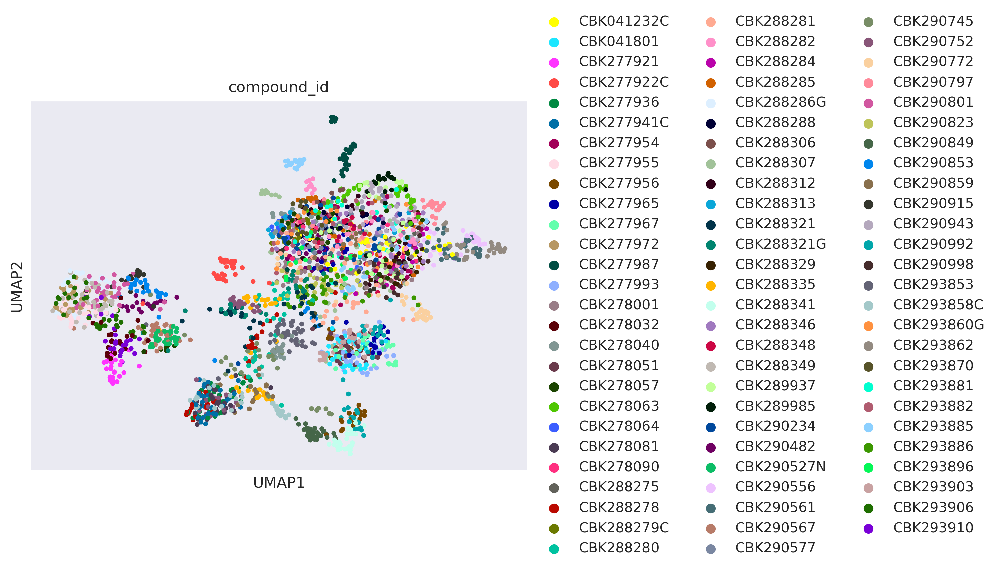

In [141]:
sc.pl.umap(adata_filtered, color='compound_id')  # Adjust 'compound_id' to the metadata column of interest

In [142]:
filtered_df.to_csv('/home/jovyan/share/data/analyses/sofia/kinase378-vt1/CellProfiler/U2OS/df_test_pred.csv', sep=';')